In [8]:
import shapely as shp
import pandas as pd, numpy as np, matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
import geopandas as gpd
import descartes
import seaborn as sns
%matplotlib inline

In [9]:
fname = 'Data/tracks_listing_households.geojson'
tracks = gpd.GeoDataFrame.from_file(fname)
print tracks.crs

{}


In [10]:
totalshape = tracks.geometry[1]
for shape in tracks.geometry:
    totalshape = totalshape.union(shape)

In [11]:
totalshape

In [12]:
un = totalshape.envelope.symmetric_difference(totalshape)
un

In [13]:
gdf = gpd.GeoDataFrame.from_file('Data/jp-sample.geojson')
gdf.head()


,Entire_home/apt,Median_income,Median_rent,Private_room,Shared_room,accesstosubway,agglomerative,agglomerativeCat,availability_365,beer_count,...,latitude,longitude,minimum_nights,name,neighbourhood,neighbourhood_group,number_of_reviews,price,reviews_per_month,room_type
0,0,21855.0,1287.0,1,0,8.368050,2,2,242,0,...,40.812747,-73.864061,2,Community Living in the Heart & Soul of NYC (3C),Clason Point,Bronx,9,59,1.53,Private room
1,0,21855.0,1287.0,1,0,8.380864,2,2,365,0,...,40.812934,-73.863814,2,"Private Room for 2, Community House NYC (2A)",Clason Point,Bronx,2,43,0.42,Private room
2,0,21855.0,1287.0,1,0,8.406552,2,2,336,0,...,40.813600,-73.863705,1,King sized bed + futon in Large Private Room ...,Clason Point,Bronx,6,76,1.37,Private room
3,0,21855.0,1287.0,1,0,8.371107,2,2,327,0,...,40.813822,-73.865384,2,"Private & Quiet Room for Two, Twin Beds (2D)",Clason Point,Bronx,17,43,3.27,Private room
4,0,21855.0,1287.0,1,0,8.428738,2,2,328,0,...,40.813927,-73.863285,2,Room for 2 in private community house in NYC (3A),Clason Point,Bronx,4,43,0.91,Private room


In [14]:
df0 = gdf[gdf['kmeans'] ==0 ]
df1 = gdf[gdf['kmeans'] ==1 ]
df2 = gdf[gdf['kmeans'] ==2 ]
df3 = gdf[gdf['kmeans'] ==3 ]
#df4 = gdf[gdf['kmeans'] ==4 ]

In [20]:
listofdf = [df0,df1,df2,df3]
thenames = ['Normal People','The 2%', 'Central Action', 'Hip Kids']

In [16]:
df = gdf[['latitude','longitude']]
coords = gdf.as_matrix(columns=['latitude','longitude'])

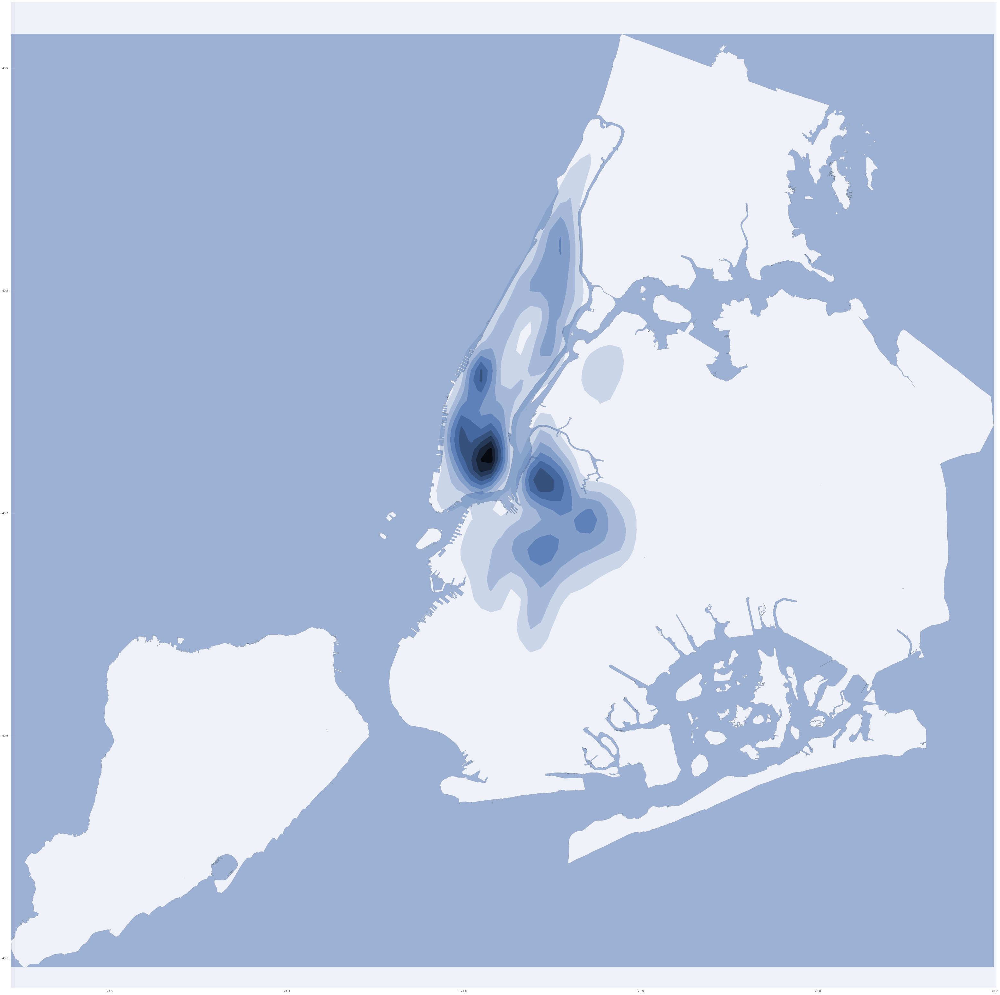

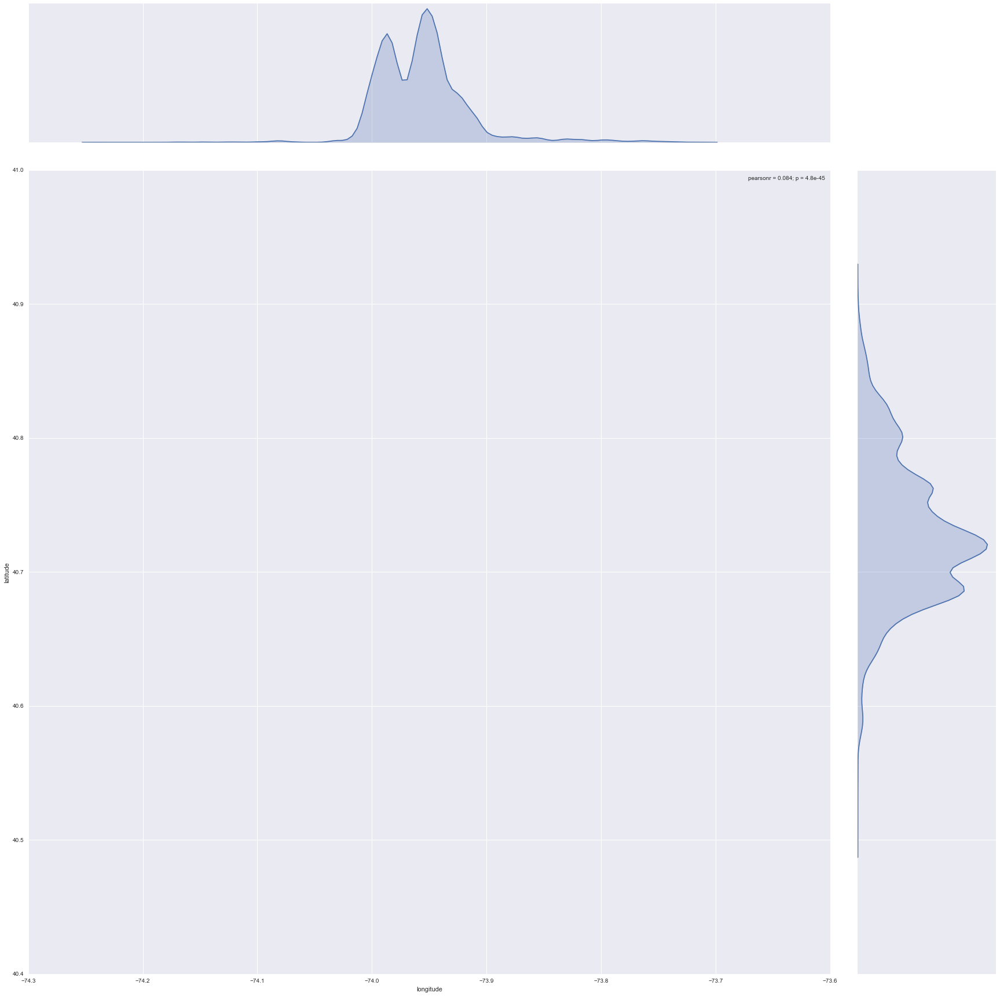

In [17]:
f, ax = plt.subplots(figsize=(55,55))
for polygon in un:

    patch = descartes.PolygonPatch(polygon, alpha=0.5, zorder=2)
    ax.add_patch(patch)
sns.jointplot(x="longitude", y="latitude", data=gdf, kind="kde", size=24,ax=ax)

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap    
mycolor1 = ListedColormap('k')
mycolor2 = ListedColormap('w')



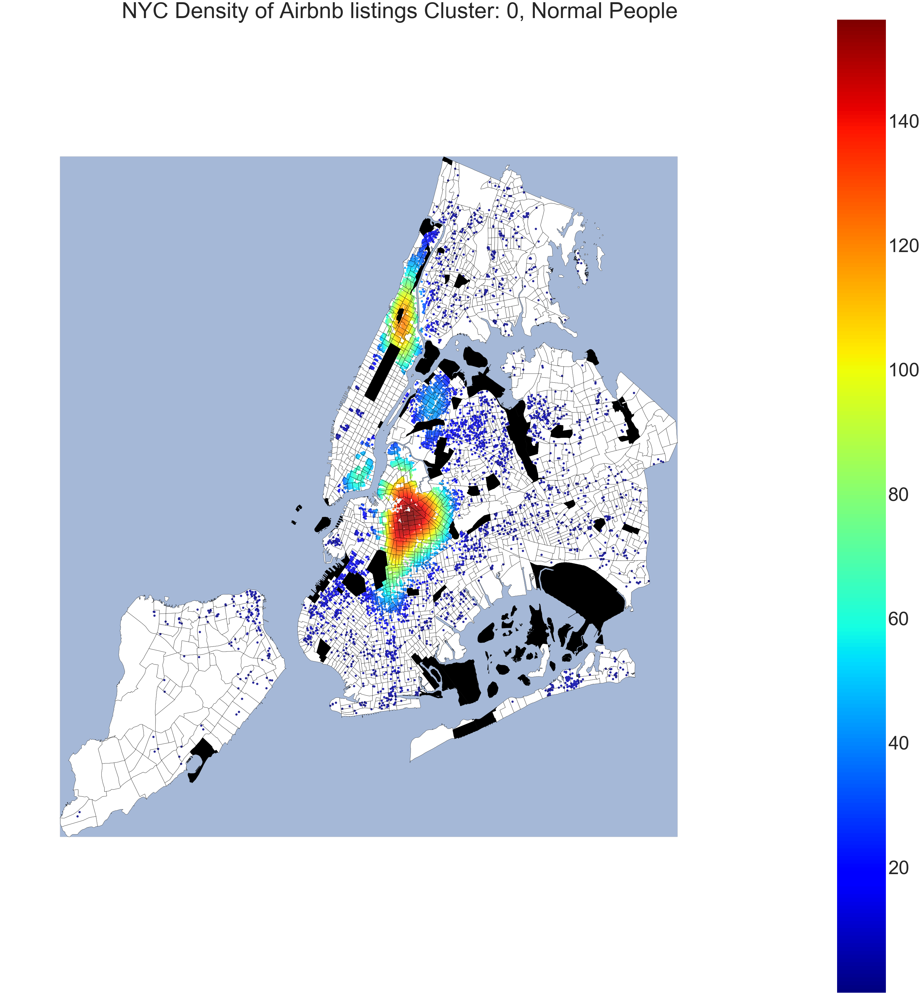

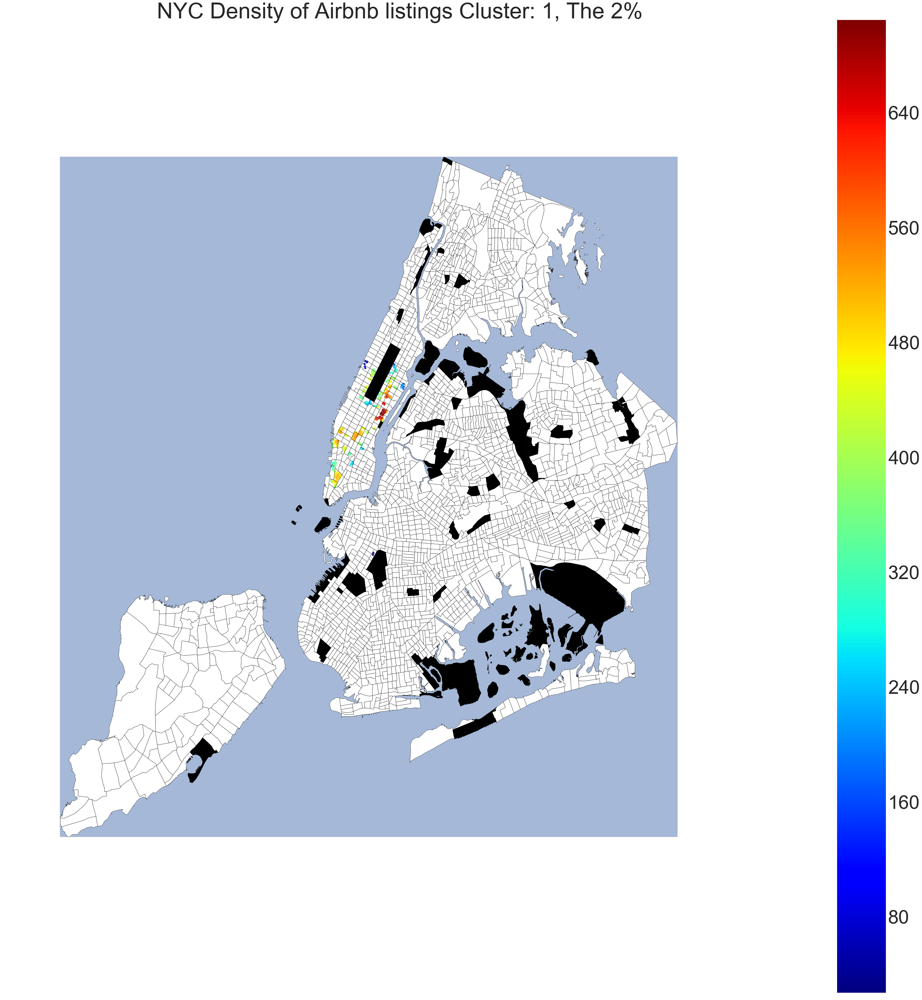

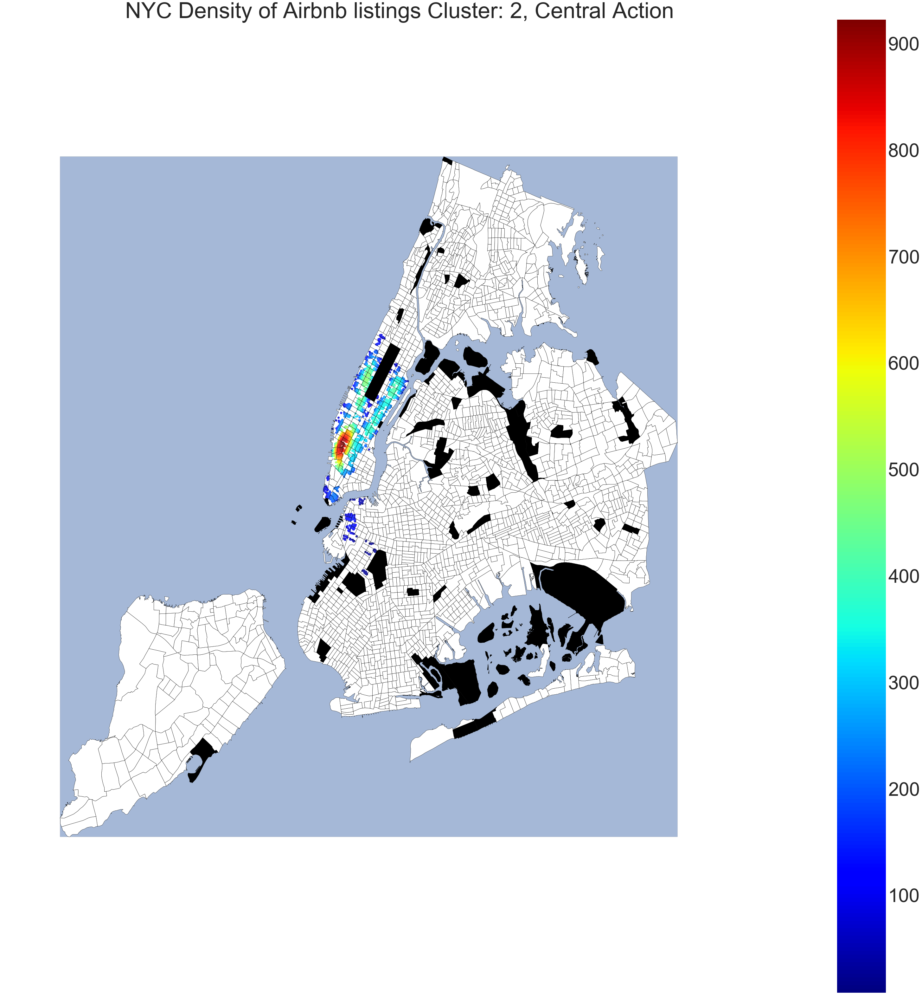

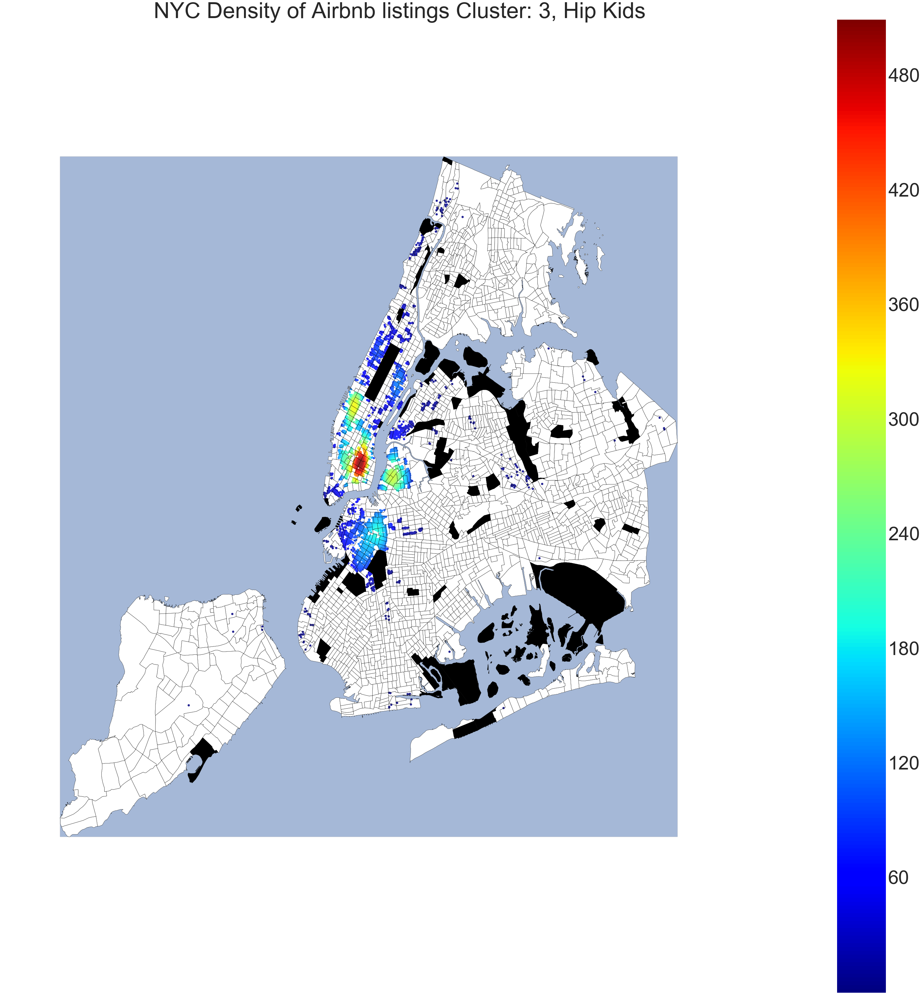

In [24]:
i=0
for df in listofdf:
    
    y = df['latitude'].as_matrix()
    x = df['longitude'].as_matrix()
    # Calculate the point density
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    plt.rcParams['axes.facecolor'] = 'white'
    f, ax = plt.subplots(figsize=(55,55))
    plt.rcParams['axes.facecolor'] = 'white'
    for polygon in un:
        patch = descartes.PolygonPatch(polygon, alpha=0.5, zorder=2)
        ax.add_patch(patch)

    tracks[tracks['HD01_VD01']==0].plot(c = 'k', linewidth = .5, ax = ax, cmap=mycolor1, alpha=1)
    tracks[tracks['HD01_VD01']>0].plot(c = 'k', linewidth = .5, ax = ax,  cmap = mycolor2, alpha=.15)
    ax.scatter(x, y, c=z, s=50, edgecolor='', cmap=plt.cm.jet )
    plt.axis('off')
    plt.title("NYC Density of Airbnb listings Cluster: "+str(i)+', '+thenames[i], size=70)
    i+=1
    normalize = mcolors.Normalize(vmin=min(z),vmax=max(z))
    colormap = cm.jet
    scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
    scalarmappaple.set_array(df.assign(cl = z))
    cbar = plt.colorbar(scalarmappaple, ax=ax)
    cbar.ax.tick_params(labelsize=60)
    plt.rcParams['axes.facecolor'] = 'white'
    plt.show()
    plt.rcParams['axes.facecolor'] = 'white'

In [36]:
features =[u'Median_income',
     #u'Median_rent',
     #u'accesstosubway',
     #u'availability_365',
     u'beer_count',
     #u'boro_ct_2010',
     #u'calculated_host_listings_count',
     u'coffee_count',
     u'connectivityScore',
     #'geometry',
     #u'host_id',
     #u'host_name',
     #u'id',
     #u'index_left',
     #u'last_review',
     #u'latitude',
     #u'longitude',
     #u'minimum_nights',
     #u'name',
     #u'neighbourhood',
     #u'neighbourhood_group',
     #u'number_of_reviews',
     u'price',
     #u'reviews_per_month',
     #u'room_type',
     #'Private_room',
     #'Entire_home/apt',
     #'Shared_room'
          ]
features

[u'Median_income',
 u'beer_count',
 u'coffee_count',
 u'connectivityScore',
 u'price']

In [44]:
def violin_feature(feature, classifier):
    f, ax = plt.subplots(figsize=(5,5))
    sns.violinplot(x=classifier, y=feature, data=gdf, inner=None, ax=ax)
    ax.set_title('{0} distribution with {1}'.format(feature, classifier), fontsize=15)
    ax.set_xlabel('Categories', fontsize=15)
    plt.xticks( fontsize = 15)
    plt.yticks( fontsize = 15)
    ax.set_ylabel(feature, fontsize=15)

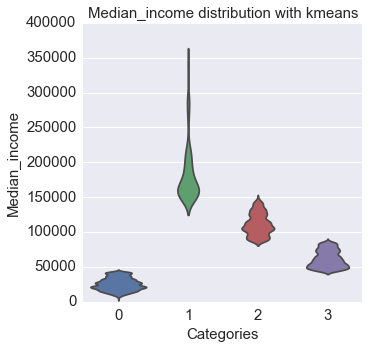

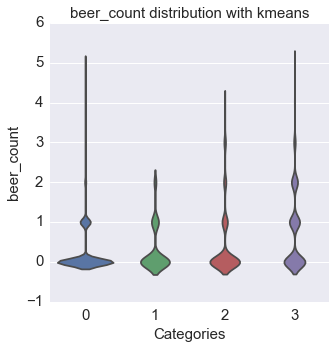

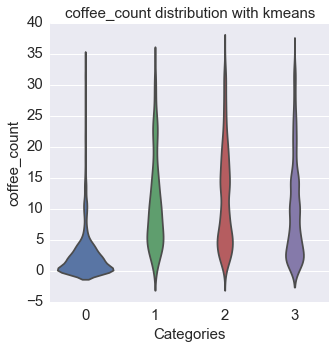

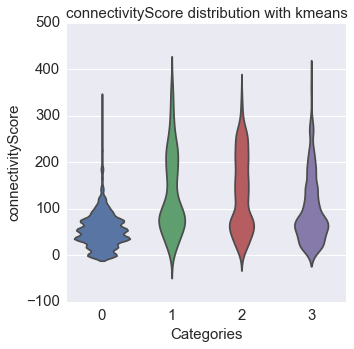

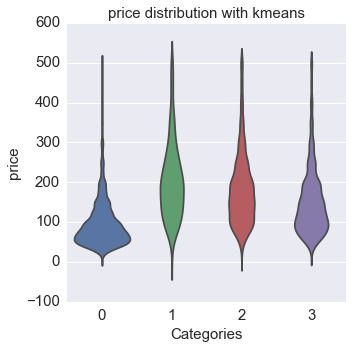

In [46]:
for feat in features:
    violin_feature(feat, 'kmeans')

In [5]:
def feature_dist(feature, classifier):
    for cid in set(gdf[classifier]):
        sns.distplot(gdf[gdf[classifier] == cid][feature], hist=False, label=str(cid))
        

    plt.legend()
    plt.show()

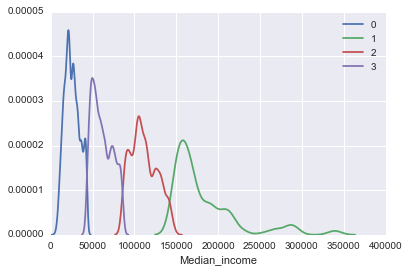

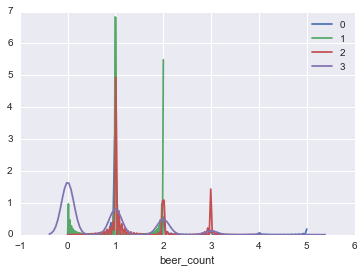

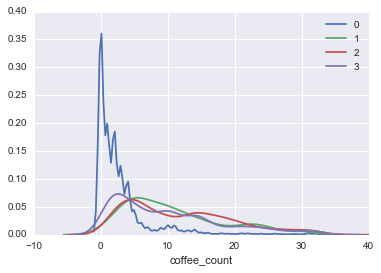

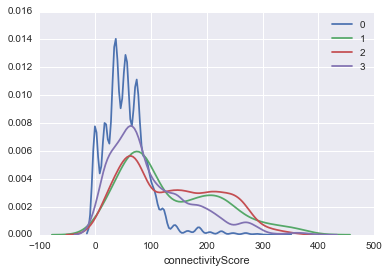

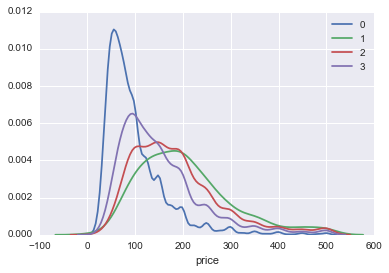

In [53]:
for feat in features:
    feature_dist(feat, 'kmeans')

In [ ]:

sns.distplot(gdf[gdf[classifier] == cid][feature], hist=False, label=str(cid))

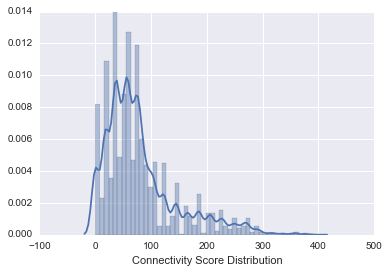

In [7]:

ax = sns.distplot(gdf.connectivityScore)
ax.set(xlabel='Connectivity Score Distribution')